# Example of utilizing a function to visualize basic Ultralytics model inference results:

In [ ]:
!pip install patched_yolo_infer

In [7]:
import cv2
import matplotlib.pyplot as plt
from ultralytics import YOLO

from patched_yolo_infer import visualize_results_usual_yolo_inference

# Inference visualization:

### 1. function __visualize_results_usual_yolo_inference__:


    Visualizes the results of usual YOLO or YOLO-seg inference on an image

    Args:
        img (numpy.ndarray): The input image in BGR format.
        model: The object detection or segmentation model (YOLO).
        imgsz (int): The input image size for the model. Default is 640.
        conf (float): The confidence threshold for detection. Default is 0.25.
        iou (float): The intersection over union threshold for detection. Default is 0.7.
        segment (bool): Whether to perform instance segmentation. Default is False.
        show_boxes (bool): Whether to show bounding boxes. Default is True.
        show_class (bool): Whether to show class labels. Default is True.
        fill_mask (bool): Whether to fill the segmented regions with color. Default is False.
        alpha (float): The transparency of filled masks. Default is 0.3.
        color_class_background (tuple): The background BGR color for class labels. Default is (0, 0, 255) (red).
        color_class_text (tuple): The text BGR color for class labels. Default is (255, 255, 255) (white).
        thickness (int): The thickness of bounding box and text. Default is 4.
        font: The font type for class labels. Default is cv2.FONT_HERSHEY_SIMPLEX.
        font_scale (float): The scale factor for font size. Default is 1.5.
        delta_colors (int): The random seed offset for color variation. Default is 3.
        dpi (int): Final visualization size (plot is bigger when dpi is higher).
        random_object_colors (bool): If True, colors for each object are selected randomly.
        show_confidences (bool): If True and show_class=True, confidences near class are visualized.
        axis_off (bool): If True, axis is turned off in the final visualization.
        show_classes_list (list): If empty, visualize all classes. Otherwise, visualize only classes in the list.
        list_of_class_colors (list/None): A list of tuples representing the colors for each class in BGR format. If provided,  
                    these colors will be used for displaying the classes instead of random colors. The number of tuples
                    in the list must match the number of possible classes in the network.
        inference_extra_args (dict): Dictionary with extra ultralytics inference parameters
        return_image_array (bool): If True, the function returns the image (BGR np.array) instead of displaying it.

    Returns:
        None or np.array if return_image_array==True

## YOLOv8 - detection visualization example:

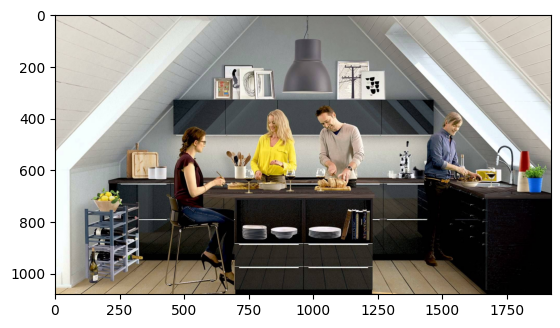

In [ ]:
# Load the image
img_path = '/content/kitchen.jpg'
img = cv2.imread(img_path)
plt.imshow(cv2.cvtColor(img.copy(), cv2.COLOR_BGR2RGB));

Let's load the YOLOv8 detection model and display all detected objects in the image:

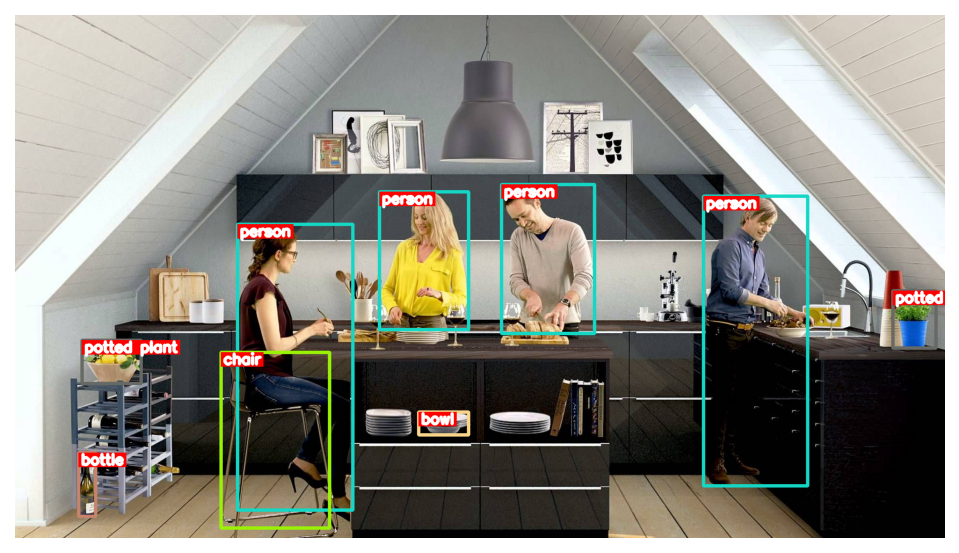

In [ ]:
# Load the YOLO model
model = YOLO("yolov8m.pt")  # Make sure the model file is in the correct path

visualize_results_usual_yolo_inference(
    img,
    model,
    conf=0.4,
    iou=0.7,
    segment=False,
    thickness=5,
    font_scale=1.0,
)

Let's display the confidence values of the predictions and customize the area for the output text:

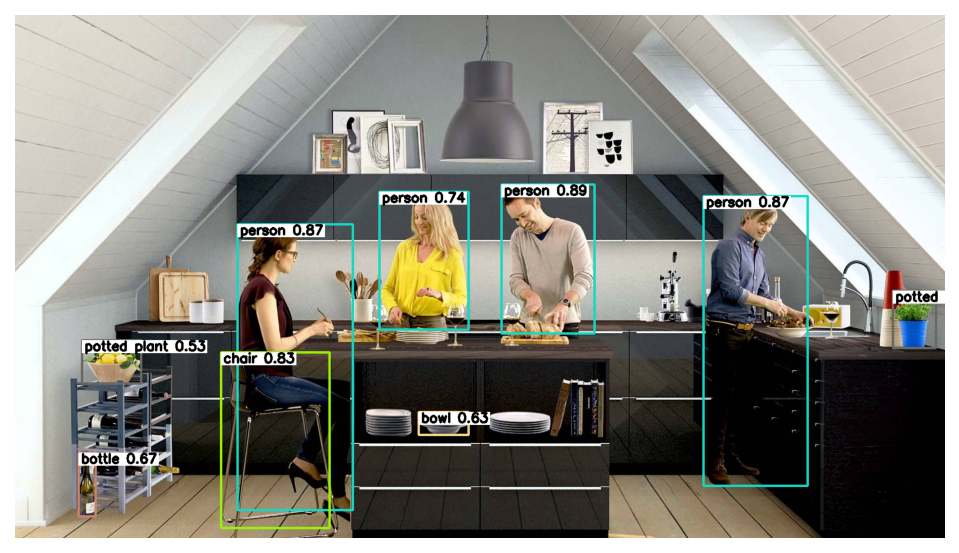

In [ ]:
visualize_results_usual_yolo_inference(
    img,
    model,
    conf=0.4,
    iou=0.7,
    segment=False,
    thickness=3,
    font_scale=0.9,
    show_confidences=True,
    color_class_background=(255, 255, 255),
    color_class_text=(0, 0, 0),
)

Let's limit the number of detectable classes and display only the boxes without additional text:

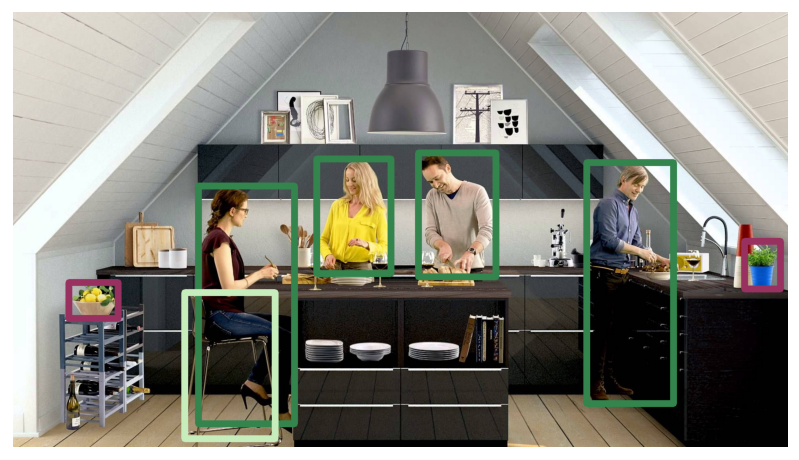

In [ ]:
visualize_results_usual_yolo_inference(
    img,
    model,
    conf=0.4,
    iou=0.7,
    show_classes_list=[0, 56, 57, 58],
    segment=False,
    show_class=False,
    thickness=15,
    delta_colors=20,
    dpi=125,
)

## YOLOv8-seg - instance segmentation vizualization example:

Let's load the YOLOv8-seg instance segmentation model and display the detected boxes and masks, filling the contour inside with 30% transparency:

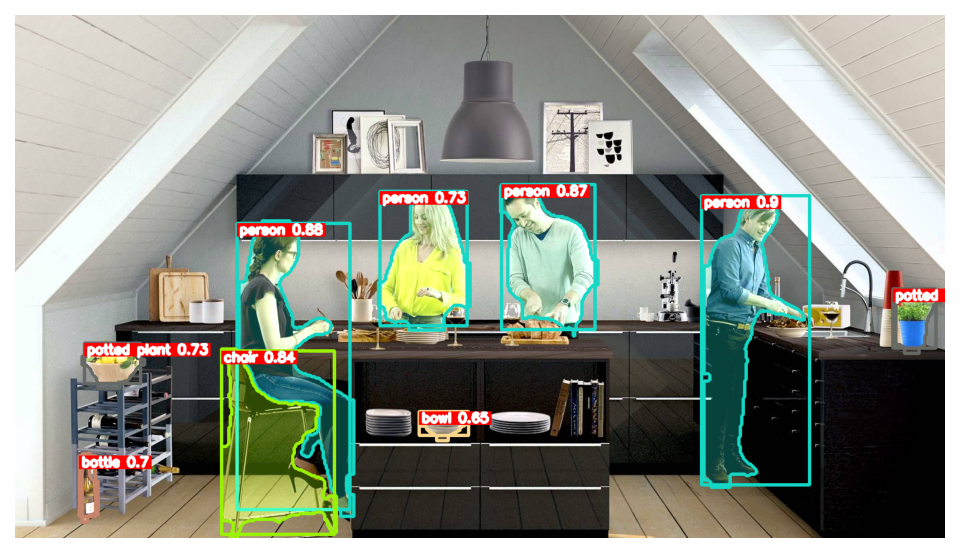

In [ ]:
# Load the YOLO model
model = YOLO("yolov8m-seg.pt")  # Make sure the model file is in the correct path

visualize_results_usual_yolo_inference(
    img,
    model,
    conf=0.4,
    iou=0.7,
    segment=True,
    thickness=5,
    font_scale=0.9,
    fill_mask=True,
    alpha=0.3,
    show_confidences=True,
)


Let's limit the number of classes, display only the masks, and change the random color values for the classes. To increase the accuracy of the contours, let's add an additional parameter with `retina_masks=True`.

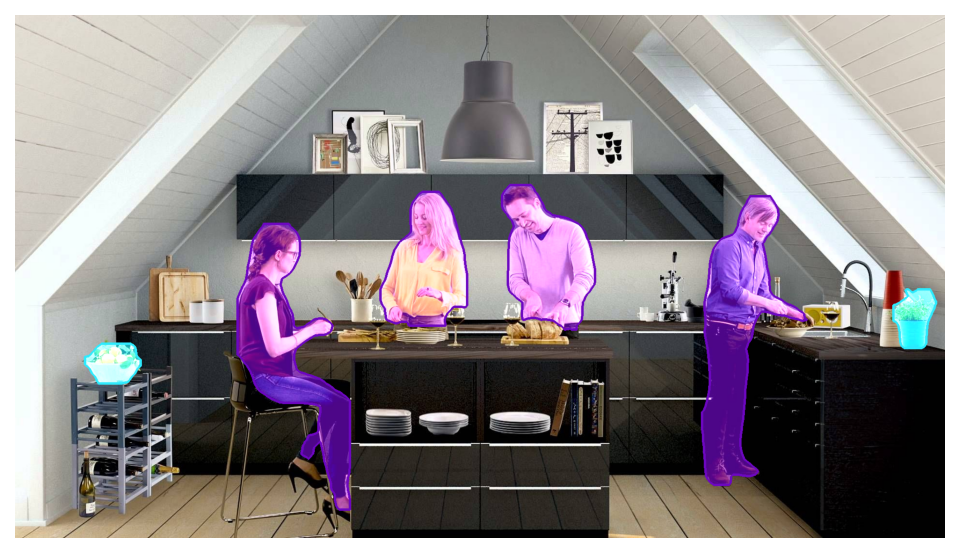

In [ ]:
visualize_results_usual_yolo_inference(
    img,
    model,
    conf=0.4,
    iou=0.7,
    show_classes_list=[0, 58],
    segment=True,
    thickness=3,
    show_boxes=False,
    fill_mask=True,
    alpha=0.7,
    show_class=False,
    delta_colors=25,
    inference_extra_args={'retina_masks':True}
)

---

## YOLO11 example

In [4]:
img_path = '/content/road_city.jpg'
img = cv2.imread(img_path)

Let's load the YOLO11 detection model and display all detected boxes without outputting additional information:

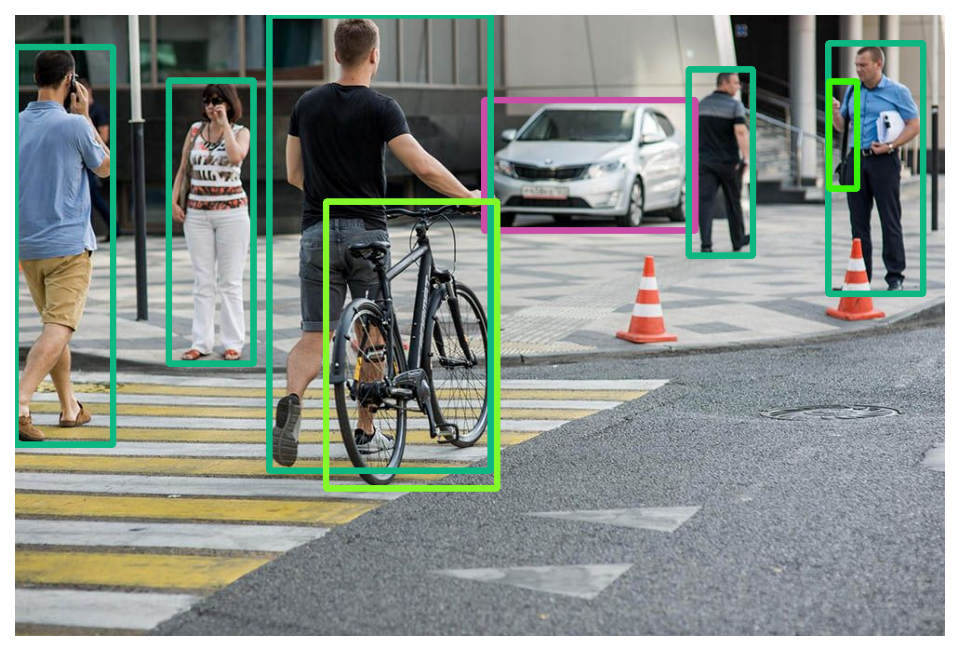

In [6]:
model = YOLO('yolo11m.pt')

visualize_results_usual_yolo_inference(
    img,
    model,
    conf=0.4,
    iou=0.7,
    segment=False,
    thickness=5,
    delta_colors=5,
    show_class=False,
)

Let's load the YOLO11-seg instance segmentation model and display the masks, ensuring each object is shown in a different random color:

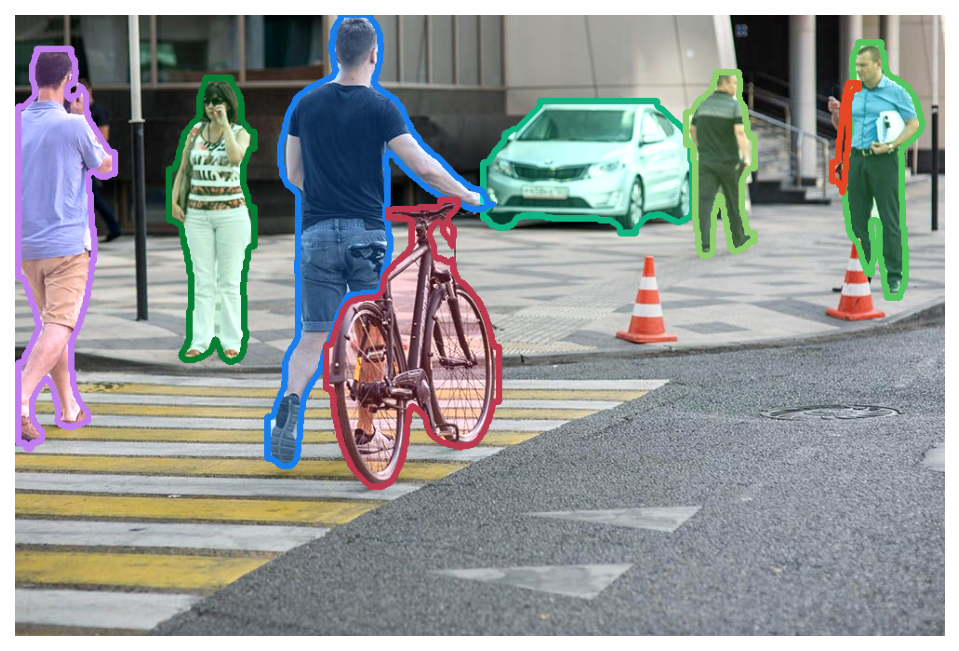

In [8]:
model = YOLO('yolo11m-seg.pt')

visualize_results_usual_yolo_inference(
    img,
    model,
    conf=0.4,
    iou=0.7,
    segment=True,
    thickness=5,
    delta_colors=5,
    show_class=False,
    show_boxes=False,
    fill_mask=True,
    random_object_colors=True,
)

Let's display only the 'person' and 'bicycle' classes and set the color values for displaying the classes ourselves. We will request to show only the contours of the objects without filling the masks:

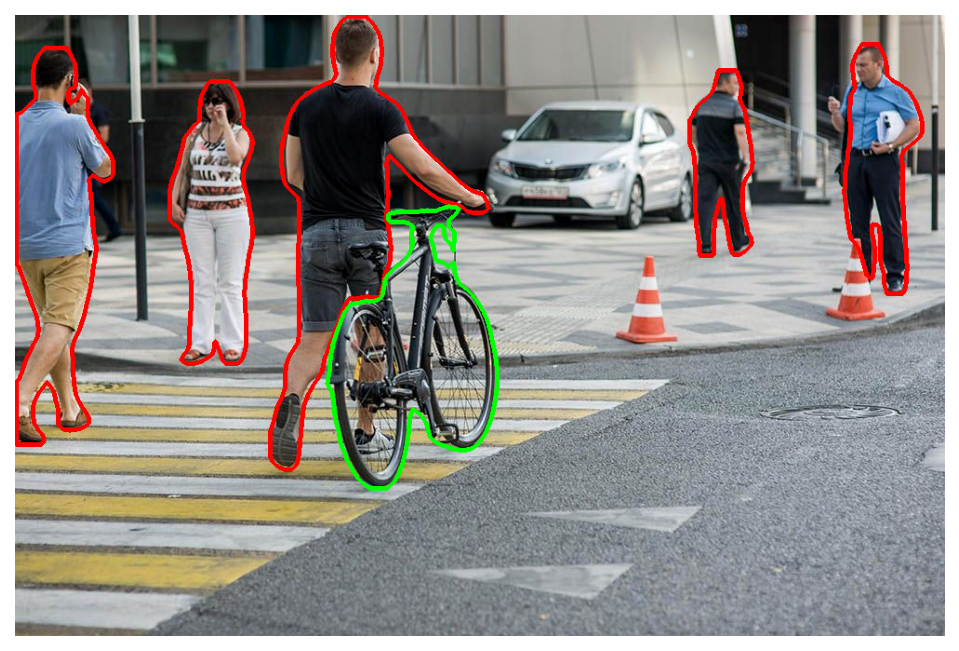

In [9]:
visualize_results_usual_yolo_inference(
    img,
    model,
    conf=0.4,
    iou=0.7,
    segment=True,
    show_classes_list=[0, 1],
    list_of_class_colors=[(0,0,255),(0,255,0)],
    inference_extra_args={'retina_masks':True},
    thickness=4,
    show_class=False,
    show_boxes=False,
    fill_mask=False,
)

## SAM example:

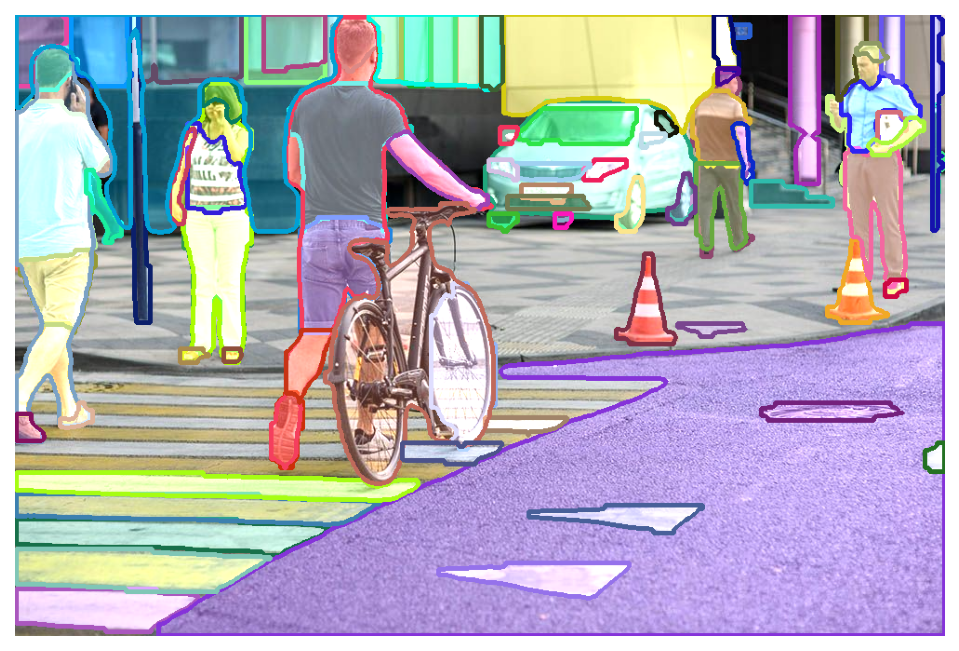

In [11]:
from ultralytics import YOLO

model = YOLO('FastSAM-x.pt')

visualize_results_usual_yolo_inference(
    img,
    model,
    imgsz=1024,
    conf=0.35,
    iou=0.7,
    segment=True,
    thickness=4,
    show_boxes=False,
    fill_mask=True,
    alpha=0.4,
    random_object_colors=True,
    show_class=False,
    dpi=150
)

## RTDTR example:

In [ ]:
img_path = '/content/cars.jpg'
img = cv2.imread(img_path)

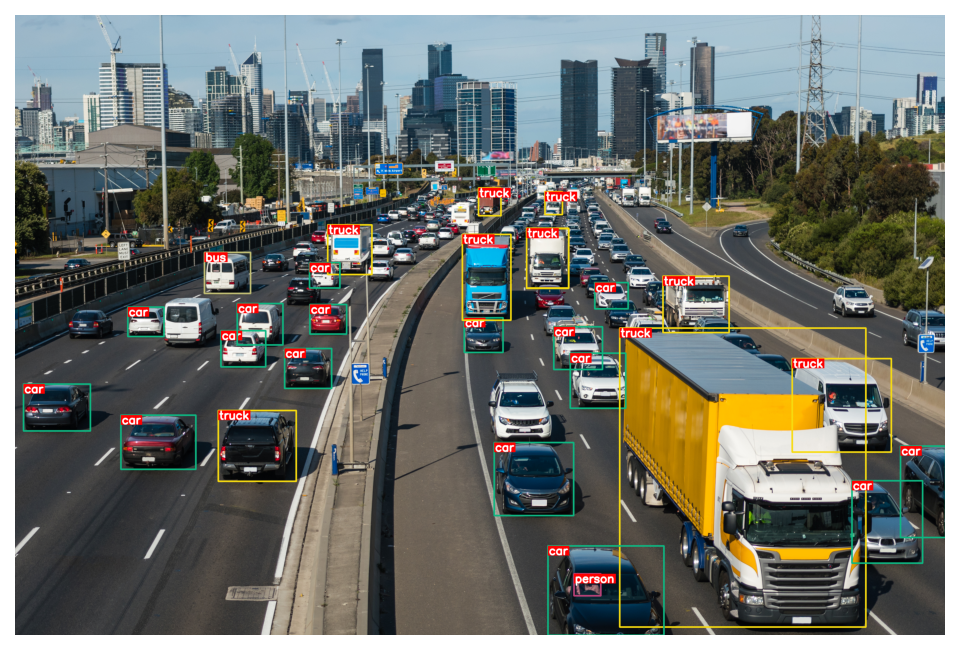

In [ ]:
from ultralytics import RTDETR

# Load a COCO-pretrained RT-DETR-l model
model = RTDETR('rtdetr-l.pt')

visualize_results_usual_yolo_inference(
    img,
    model,
    conf=0.5,
    iou=0.7,
    segment=False,
    delta_colors=3,
    thickness=8,
    font_scale=2.0,
)

## How to save the visualization result as an image

use return_image_array=True and then cv2.imwrite

In [ ]:
result = visualize_results_usual_yolo_inference(
    img,
    model,
    conf=0.5,
    iou=0.7,
    segment=False,
    delta_colors=3,
    thickness=8,
    font_scale=2.0,
    return_image_array=True
)
cv2.imwrite('/path/to/destination/image.jpg', result)

---

# YOLO-pose - Pose Esimation Example

In [9]:
import cv2
from ultralytics import YOLO

from patched_yolo_infer import visualize_results_yolo_pose_inference

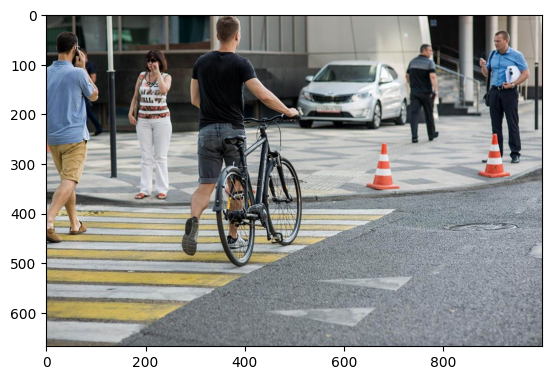

In [13]:
# Load the image
img_path = '/content/road_city.jpg'
img = cv2.imread(img_path)
plt.imshow(cv2.cvtColor(img.copy(), cv2.COLOR_BGR2RGB));

An example of simple visualization without specifying additional parameters except for the visibility of points and the confidence of object detection:

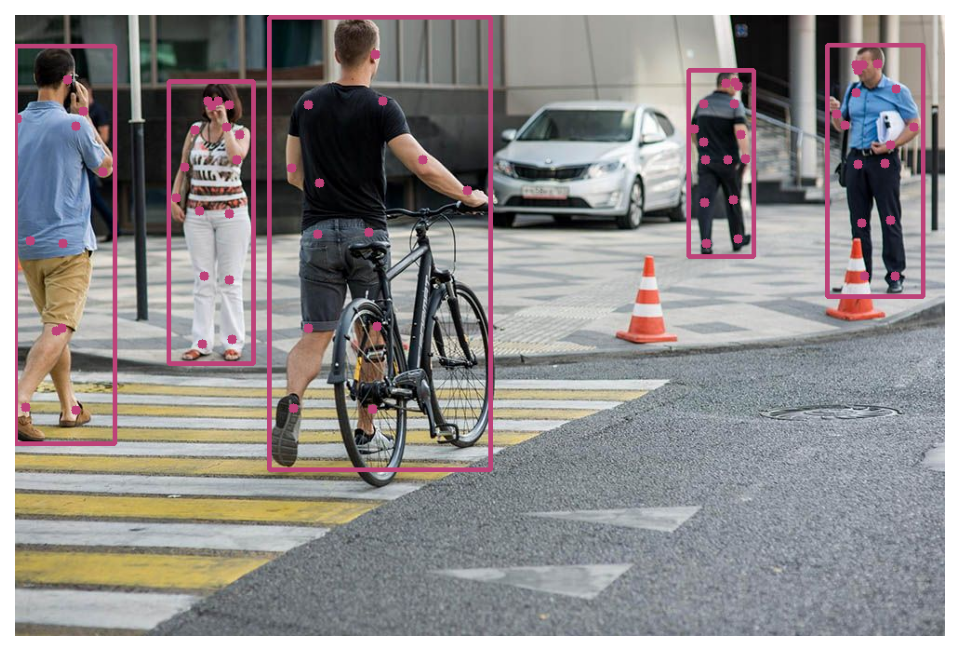

In [19]:
model = YOLO("yolo11m-pose.pt") 

visualize_results_yolo_pose_inference(
    img,
    model,
    conf=0.4,
    iou=0.7,
    min_landmarks_visibility=0.25,
    thickness=3,
    point_radius=5
)

Now we will display only the points corresponding to the hands and ask to specify the class name and the confidence of object detection. Also, for convenience, we will display each object in a random color:

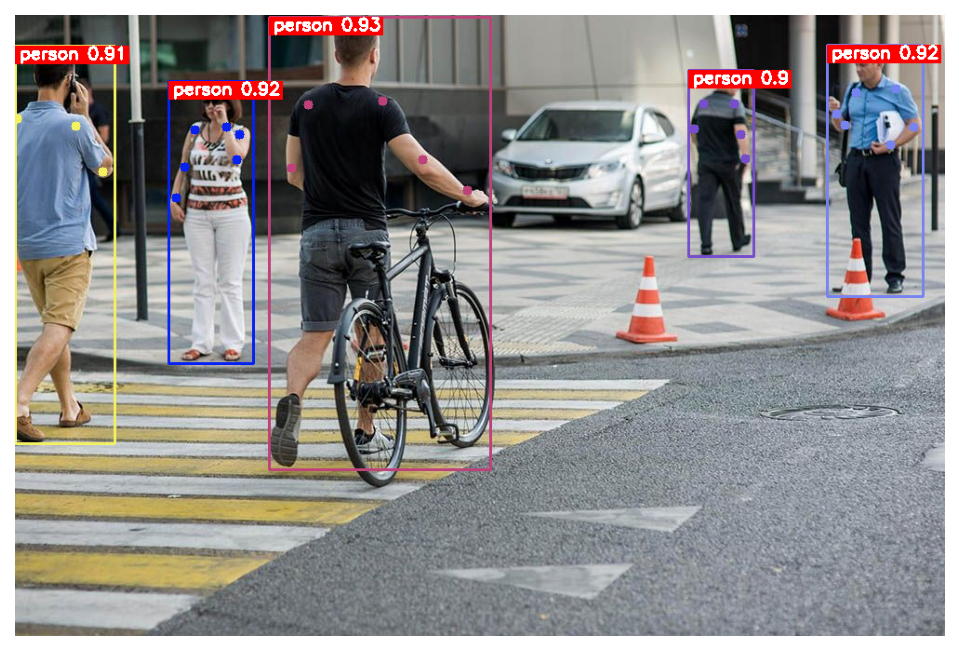

In [40]:
visualize_results_yolo_pose_inference(
    img,
    model,
    conf=0.4,
    iou=0.7,
    min_landmarks_visibility=0.8,
    show_points_list=[5,7,6,8,9,10],
    random_object_colors=True,
    point_radius=5,
    thickness=2,
    show_class=True,
    font_scale=0.6,
    show_confidences=True
)

Let's define the skeleton as an enumeration of tuples with the values of the points that need to be connected to each other:

In [26]:
point_pairs = [
    (5, 11), (6, 12),  # Torso
    (11, 12),  # Between legs
    (0, 1), (0, 2), (1, 3), (2, 4),  # Head
    (5, 6),  # Shoulder connection
    (5, 7), (7, 9),  # Left arm
    (6, 8), (8, 10),  # Right arm
    (11, 13), (13, 15),  # Left leg
    (12, 14), (14, 16)  # Right leg
]

Let's display the skeletons in random colors and the detected points in red. Also, we will remove the bounding boxes from the visualization:

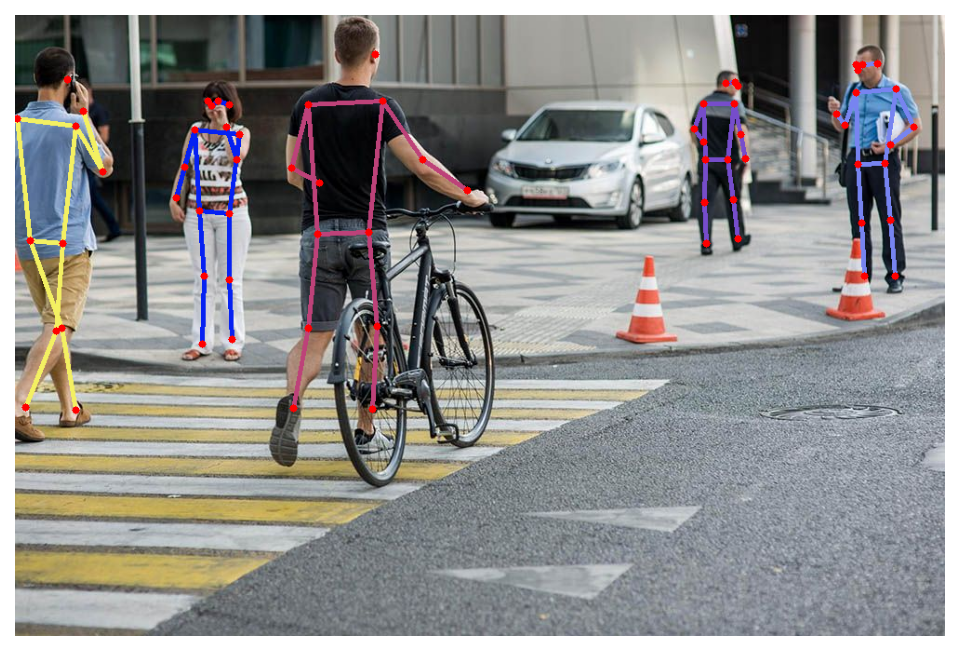

In [49]:
visualize_results_yolo_pose_inference(
    img,
    model,
    conf=0.4,
    iou=0.7,
    min_landmarks_visibility=0.4,
    random_object_colors=True,
    show_boxes=False,
    point_radius=4,
    thickness=3,
    point_color=(0,0,255),
    connection_schema=point_pairs,
)


**List of existing parameters for the visualize_results_yolo_pose_inference function:**
```
Args:
    img (numpy.ndarray): The input image in BGR format.
    model: The YOLO-pose model. Default is "yolo11m-pose.pt".
    imgsz (int): The input image size for the model. Default is 640.
    conf (float): The confidence threshold for detection. Default is 0.25.
    iou (float): The intersection over union threshold for detection. Default is 0.7.
    thickness (int): The thickness of bounding box, text and skeleton connections. Default is 4.
    point_radius (int): The radius of the landmark points to be drawn on the image. Default is 5.
    connection_schema (list):  A list of tuples defining how landmarks should be connected to form a skeleton. 
        Each tuple contains two indices representing the landmarks to be connected.
        If None or empty, only landmarks will be drawn without any connections.
    min_landmarks_visibility (float): The minimum confidence threshold for a landmark's visibility to be drawn. 
    show_boxes (bool): Whether to show bounding boxes. Default is True.
    show_class (bool): Whether to show class labels. Default is False.
    color_class_background (tuple / list of tuple): The background BGR color for class labels. Default is (0, 0, 255) (red).
    color_class_text (tuple): The text BGR color for class labels. Default is (255, 255, 255) (white).
    delta_colors (int): The random seed offset for color variation. Default is 3.
    list_of_class_colors (list / None): A list of tuples representing the colors for each class in BGR format.  
        If provided, these colors will be used for displaying the classes instead of random colors. 
        The number of tuples in the list must match the number of possible classes in the network.
    random_object_colors (bool): If True, colors for each object are selected randomly.
    point_color (tuple / None): If None, then the point color is chosen to be the same as the box and skeleton;
        otherwise, the one you specify.
    font: The font type for class labels. Default is cv2.FONT_HERSHEY_SIMPLEX.
    font_scale (float): The scale factor for font size. Default is 1.5.
    dpi (int): Final visualization size (plot is bigger when dpi is higher).
    show_confidences (bool): If True and show_class=True, confidences near class are visualized.
    axis_off (bool): If True, axis is turned off in the final visualization.
    show_classes_list (list): If empty, visualize all classes. Otherwise, visualize only classes in the list.
    show_points_list (list): If empty, visualize all points. Otherwise, visualize only points in the list.
    inference_extra_args (dict / None): Dictionary with extra ultralytics inference parameters.
    return_image_array (bool): If True, the function returns the image bgr array instead of displaying it. 
                                Default is False.

Returns:
    None/np.array
```

---

# Cropping with Overlapping:

### 2. function __get_crops__:


    Preprocessing of the image. Generating crops with overlapping.

    Args:
        image_full (array): numpy array of a BGR image.
        shape_x (int): size of the crop in the x-coordinate.
        shape_y (int): size of the crop in the y-coordinate.
        overlap_x (float, optional): Percentage of overlap along the x-axis
            (how much subsequent crops borrow information from previous ones). Default is 15.
        overlap_y (float, optional): Percentage of overlap along the y-axis
            (how much subsequent crops borrow information from previous ones). Default is 15.
        show (bool): enables the mode to display images using plt.imshow. Default is False.
        save_crops (bool): enables saving generated images. Default is False.
        save_folder (str): folder path to save the images. Default is "crops_folder".
        start_name (str): starting name for saved images. Default is "image".
        resize (bool): If True, the image is resized to fit the last crop exactly.
                       If False, the image is not resized. Default is False.

    Returns:
        data_all_crops (list): List containing cropped images.


In [8]:
from patched_yolo_infer import get_crops
import numpy as np

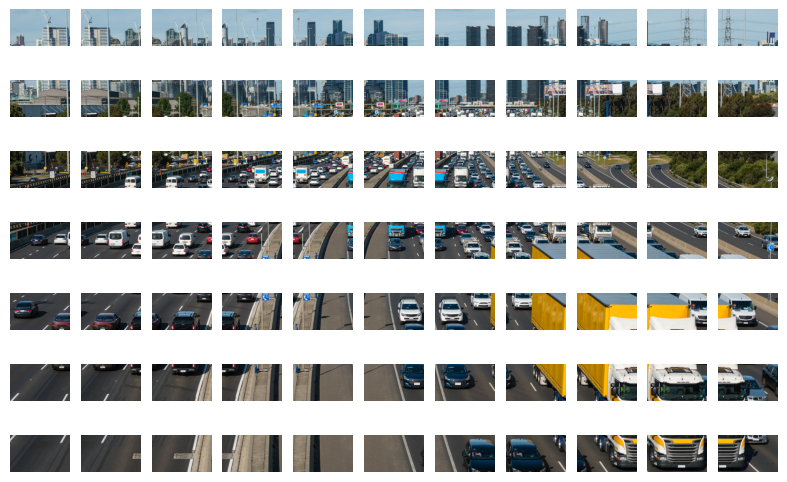

Number of generated images: 77


In [ ]:
img_path = '/content/image-test.jpg'
image = cv2.imread(img_path)

data_all_crops = get_crops(
    image,
    shape_x=800,
    shape_y=500,
    overlap_x=50,
    overlap_y=10,
    show=True,
    save_crops=True,
    start_name="img",
    resize=True,
)

In [ ]:
np.array(data_all_crops).shape

(77, 500, 800, 3)

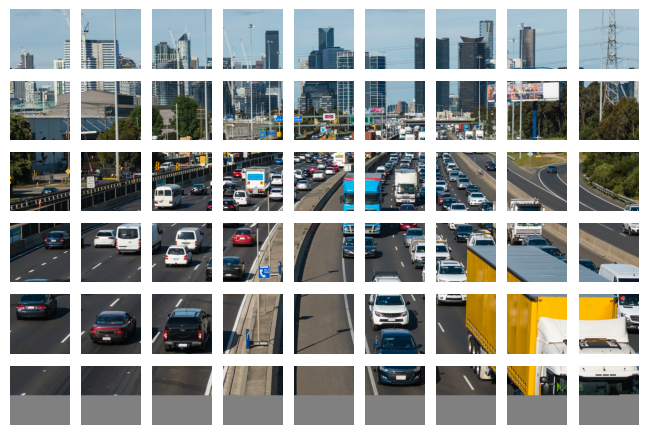

Number of generated images: 54


In [ ]:
data_all_crops = get_crops(image, shape_x=500, shape_y=500, overlap_x=0, overlap_y=0, show=True)

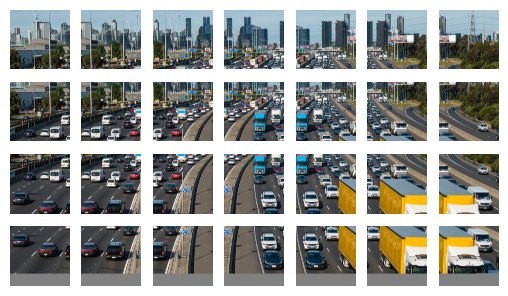

Number of generated images: 28


In [ ]:
data_all_crops = get_crops(image, shape_x=1200, shape_y=1200, overlap_x=50, overlap_y=50, show=True)

Exemple of one outut crop from the list:

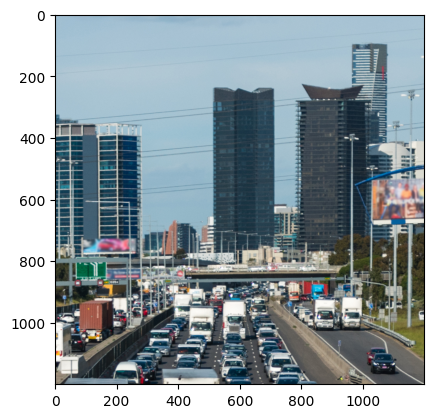

In [ ]:
plt.imshow(cv2.cvtColor(data_all_crops[4].copy(), cv2.COLOR_BGR2RGB));